In [16]:
import os
import ssl
import glob
from IPython import display
from irods.session import iRODSSession
try:
    env_file = os.environ['IRODS_ENVIRONMENT_FILE']
except KeyError:
    env_file = os.path.expanduser('~/.irods/irods_environment.json')

ssl_context = ssl.create_default_context(
        purpose=ssl.Purpose.SERVER_AUTH,
        cafile=None, capath=None, cadata=None
        )
ssl_settings = {'ssl_context': ssl_context}

session = iRODSSession(irods_env_file=env_file, **ssl_settings)

In [17]:
home_dir = "/ghum/home/ghum_pilot034/"
dataset_dir = home_dir + 'DATASET_2/'
output_dir = home_dir + 'TEAM_2/'

vsc_user = "vsc35516"
scratch_dir = f"/scratch/leuven/{vsc_user[3:6]}/{vsc_user}/"
scratch_dir

'/scratch/leuven/355/vsc35516/'

In [18]:
coll = session.collections.get(home_dir)
coll.subcollections[0].subcollections[0].subcollections[0].data_objects[:5]

[<iRODSDataObject 38515 FL3562256_1_VIEW_MAIN.jpg>,
 <iRODSDataObject 40948 FL3562257_2_VIEW_MAIN.jpg>,
 <iRODSDataObject 40966 FL3562259_3_VIEW_MAIN.jpg>,
 <iRODSDataObject 40972 FL3562260_4_VIEW_MAIN.jpg>,
 <iRODSDataObject 40990 FL3562261_5_VIEW_MAIN.jpg>]

In [19]:
suzanna_team_dir = home_dir + 'TEAM_2/output_suzanna'
suzanna_coll = session.collections.create(suzanna_team_dir) # this won't do anything if you created it before
suzanna_coll.path

'/ghum/home/ghum_pilot034/TEAM_2/output_suzanna'

In [4]:
suzanna_coll.data_objects # the folder does not have objects right now

[]

In [12]:
# download an image from ManGO to scratch dir
image_from_mango = coll.subcollections[0].subcollections[0].subcollections[0].data_objects[312]
# if exact image name is given
# image_name = 'FL3562304_34_VIEW_MAIN.jpg'
# image_from_mango = session.data_objects.get(coll.subcollections[0].subcollections[0].subcollections[0].path +"/"+image_name)
# full path name // not working
# image_path = glob.glob('/ghum/home/ghum_pilot034/DATASET_2/IE3562253/REP3562255/*_609_VIEW_MAIN.jpg')
# print(image_path)
# image_from_mango = session.data_objects.get(image_path)
# print(image_from_mango.path)

img_path = scratch_dir + 'REP3562255/' + image_from_mango.name
print(img_path)

# download image from mango to scratch
session.data_objects.get(image_from_mango.path, img_path) # cannot overwrite

/scratch/leuven/355/vsc35516/REP3562255/FL3562740_313_VIEW_MAIN.jpg


<iRODSDataObject 36952 FL3562740_313_VIEW_MAIN.jpg>

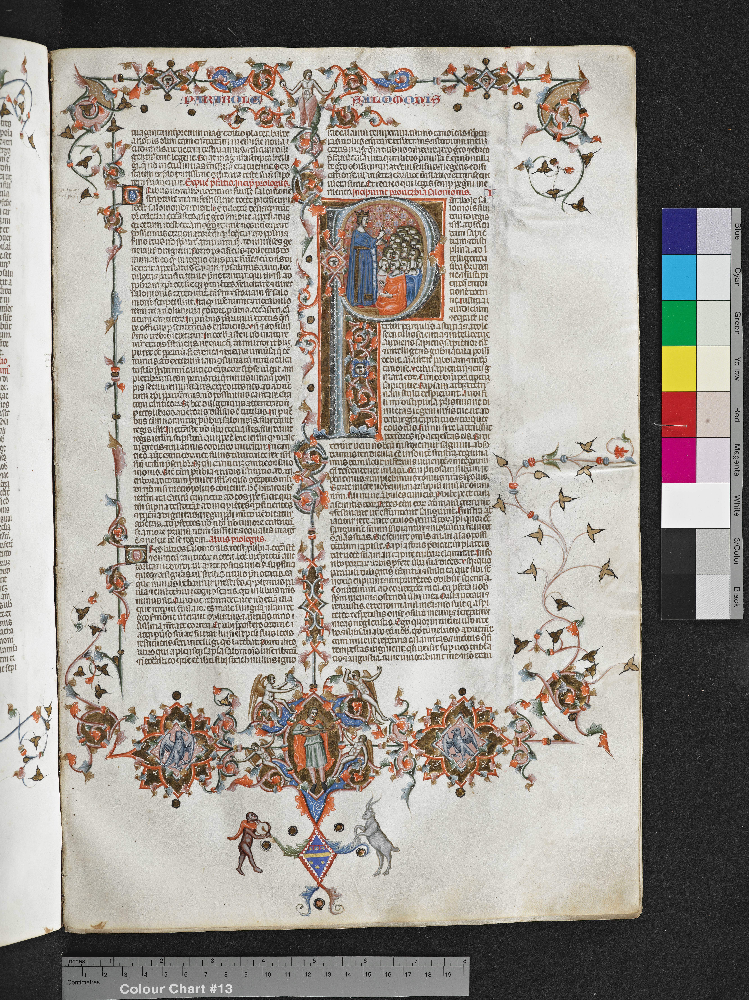

In [13]:
display.Image(img_path)

In [20]:
# # download all images to scratch

# import os
# def get_collection(output_dir, collection):
#     path = os.path.join(output_dir, collection.name) # join the output directory to the name of the collection
#     if not os.path.exists(path): # create new directory for collection if needed
#         os.mkdir(path)
#     for subcol in collection.subcollections: # go through each subcollection and do the same
#         get_collection(path, subcol)
#     for object in collection.data_objects: # go through each of the objects and get it
#         # the output path of the object is its name combined to the existing path
#         session.data_objects.get(object.path, os.path.join(path, object.name))

# top_col = session.collections.get(home_dir + "DATASET_2")
# get_collection(scratch_dir, top_col)

In [22]:
# list all images in scratch dir
scratch_img_dir = scratch_dir + 'DATASET_2/IE3562253/REP3562255/*.jpg'
import glob
scratch_imgs = glob.glob(scratch_img_dir)
print(len(scratch_imgs))

701


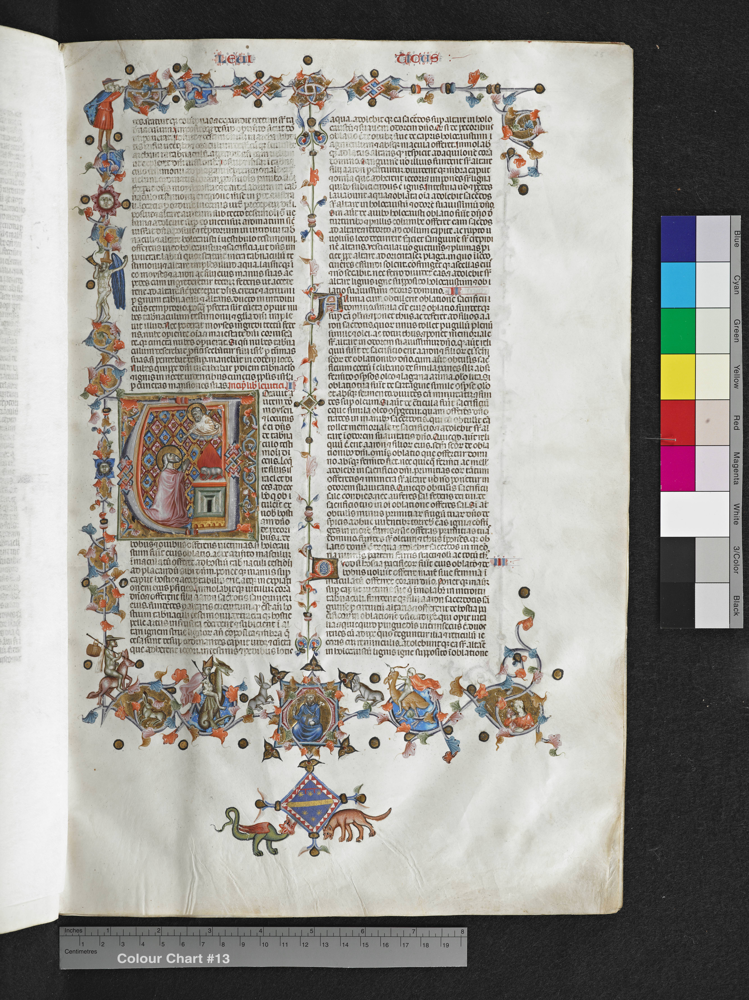

In [24]:
# import one image from scratch dir
folio_nr = '59'
test_im = glob.glob(scratch_dir + 'DATASET_2/IE3562253/REP3562255/*_{}_*.jpg'.format(folio_nr))[0]
display.Image(test_im)

Cropping and saving an image

In [25]:
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
import cv2

In [26]:
# info about the image
image = Image.open(test_im)
print("filename: ", image. filename)
print("Format: ", image.format)
print("Mode: ", image.mode)
print("Width: ", image.width)
print("Height: ", image.height)
image.show()

filename:  /scratch/leuven/355/vsc35516/DATASET_2/IE3562253/REP3562255/FL3562342_59_VIEW_MAIN.jpg
Format:  JPEG
Mode:  RGB
Width:  5336
Height:  7121


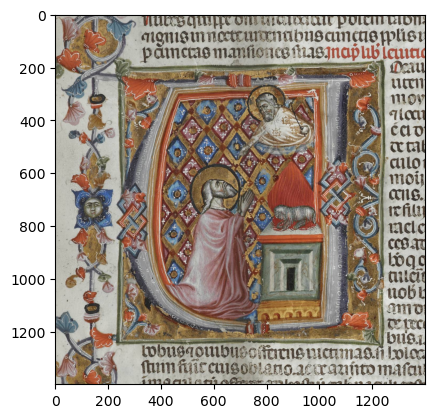

In [31]:
# reading image in cv2 and cropping it
img_bgr = cv2.imread(test_im)
im_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
# plt.imshow(im_rgb)
# # plt.rcParams["figure.figsize"] = (20,20)
# plt.show()

# crop height and widths
h_0, h_1 = 2600,4000
w_0, w_1 = 600,2000

snip_RGB = im_rgb[h_0:h_1,w_0:w_1]
snip_BGR = img_bgr[h_0:h_1,w_0:w_1]
plt.imshow(snip_RGB)
plt.show()

Using Selective Search

This identifies each (group of) letters

https://github.com/AlpacaTechJP/selectivesearch

In [32]:
import skimage.data
import selectivesearch

img = skimage.io.imread(test_im)
img = img[h_0:h_1,w_0:w_1]

img_lbl, regions = selectivesearch.selective_search(img, scale=500, sigma=0.9, min_size=3000) # min_size = 200 (letters)
print(len(regions))

/data/leuven/355/vsc35516/miniconda3/envs/envirods/lib/python3.10/site-packages/skimage/feature/texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


117


In [117]:
print(regions[1]) # XY width height

{'rect': (0, 0, 28, 946), 'size': 15190, 'labels': [1.0]}


(759, 297, 86, 112)
6665


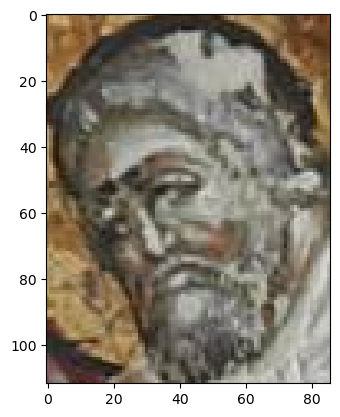

In [33]:
rect = regions[20]['rect']
print(rect)
print(regions[20]['size'])
[X, Y, W, H] = rect

img_ss = img[Y:Y+H, X:X+W]
plt.imshow(img_ss)
plt.show()

In [154]:
from skimage import io, color

img_hsv = cv2.cvtColor(snip_RGB, cv2.COLOR_BGR2HSV)
mask1 = cv2.inRange(img_hsv, (0,50,20), (5,255,255))
mask2 = cv2.inRange(img_hsv, (175,50,20), (180,255,255))
mask = cv2.bitwise_or(mask1, mask2 )

# Determine if the color exists on the image
if cv2.countNonZero(mask) > 0:
    print('Red is present!')
else:
    print('Red is not present!')

Red is present!


(0, 0, 205, 90)
10188
Red is not present!


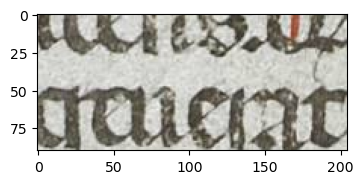

(152, 0, 216, 88)
11923
Red is not present!


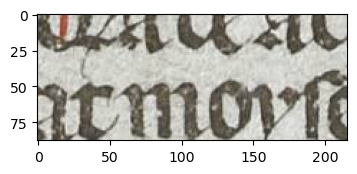

(0, 0, 705, 2399)
1203472
Red is present!


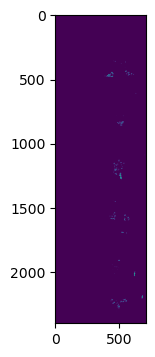

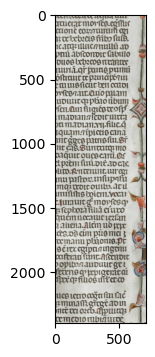

(648, 0, 451, 773)
246487
Red is present!


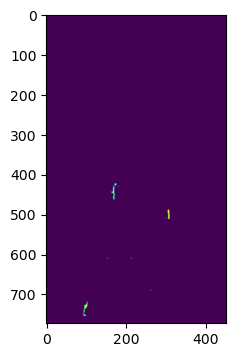

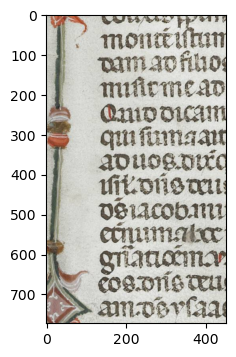

(1005, 0, 94, 82)
4623
Red is not present!


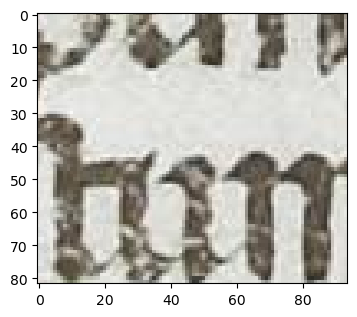

(649, 2, 64, 273)
6359
Red is not present!


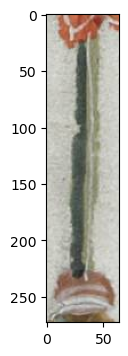

(995, 40, 104, 102)
4942
Red is not present!


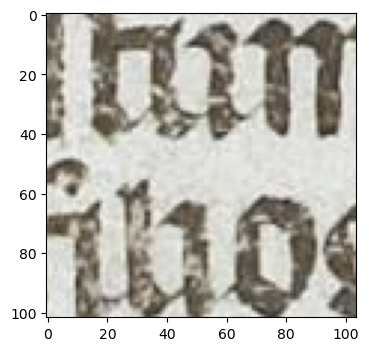

(0, 48, 176, 90)
9003
Red is not present!


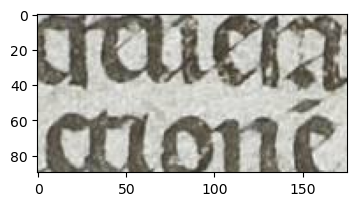

(309, 48, 165, 95)
5491
Red is not present!


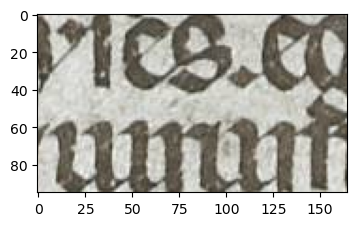

(842, 153, 179, 55)
5022
Red is not present!


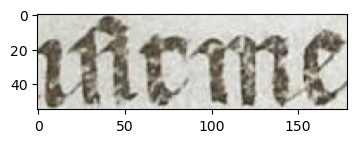

(0, 285, 549, 218)
57483
Red is present!


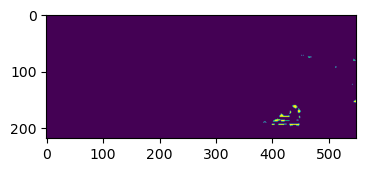

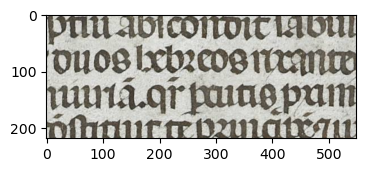

(645, 331, 45, 326)
6039
Red is not present!


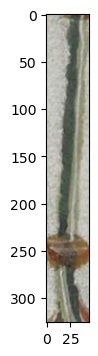

(886, 344, 182, 109)
4616
Red is not present!


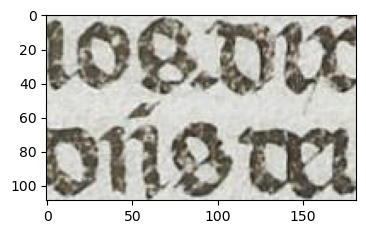

(784, 507, 209, 82)
6372
Red is present!


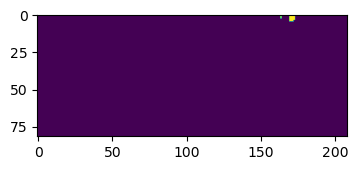

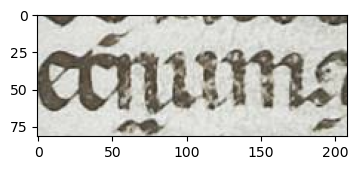

(841, 542, 172, 93)
6413
Red is present!


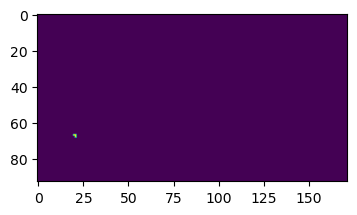

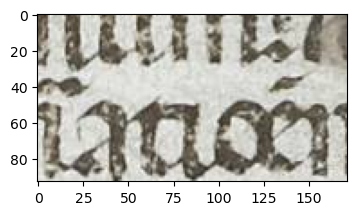

(0, 584, 335, 118)
17363
Red is not present!


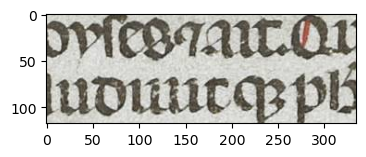

(162, 588, 409, 249)
44691
Red is present!


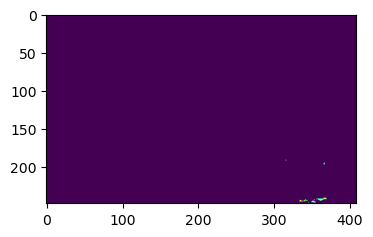

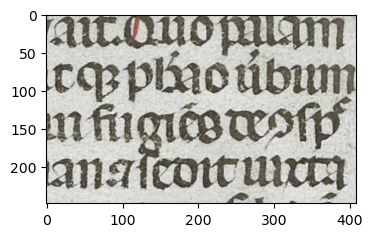

(791, 591, 308, 103)
14090
Red is present!


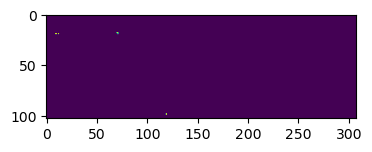

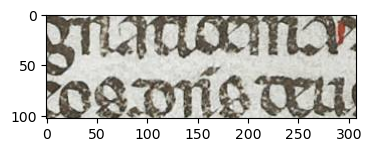

(597, 594, 175, 233)
16031
Red is present!


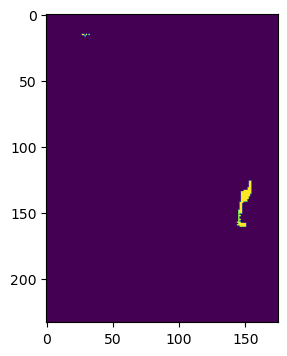

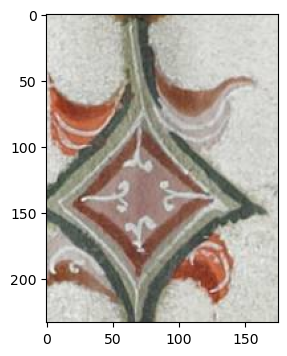

(572, 643, 192, 508)
16515
Red is present!


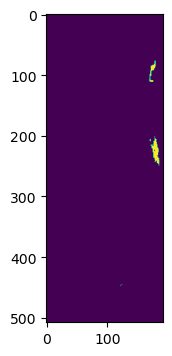

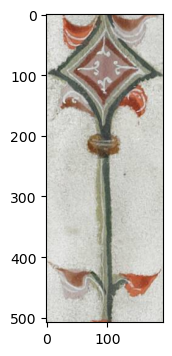

(877, 651, 123, 46)
3299
Red is present!


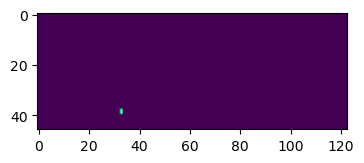

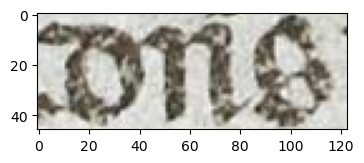

(1009, 684, 90, 74)
4055
Red is not present!


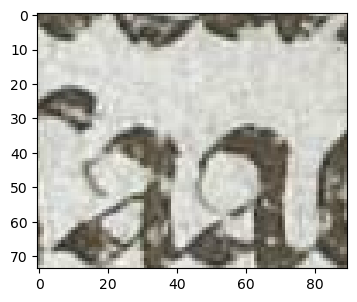

(641, 706, 458, 1091)
408788
Red is present!


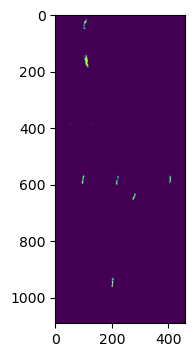

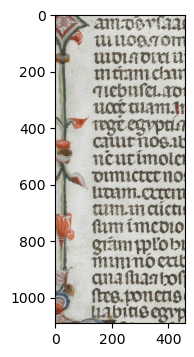

(964, 889, 135, 99)
6368
Red is not present!


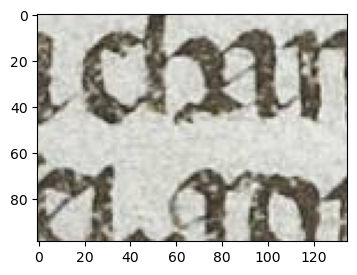

(101, 896, 131, 162)
6705
Red is not present!


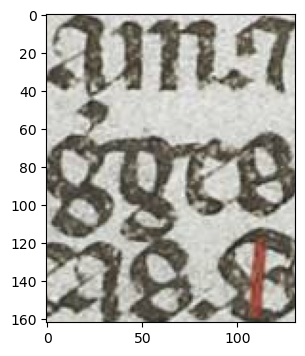

(0, 907, 305, 272)
32489
Red is not present!


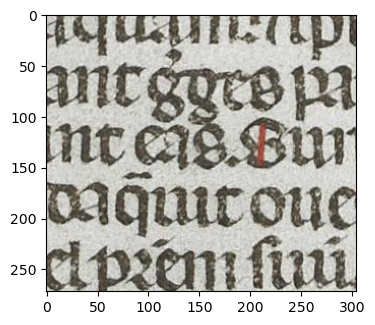

(831, 1074, 178, 101)
8467
Red is not present!


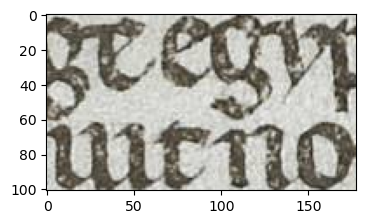

(577, 1147, 165, 462)
19242
Red is present!


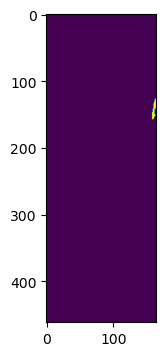

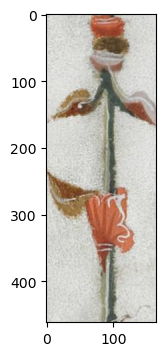

(268, 1446, 137, 96)
7413
Red is not present!


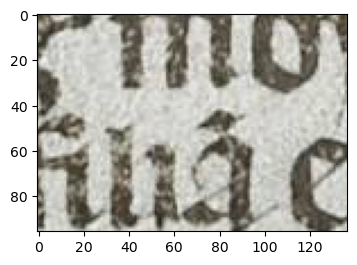

(597, 1515, 130, 318)
15521
Red is not present!


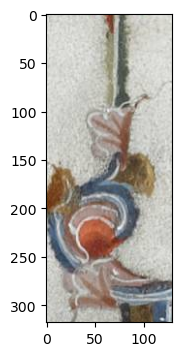

(0, 1558, 306, 167)
24504
Red is not present!


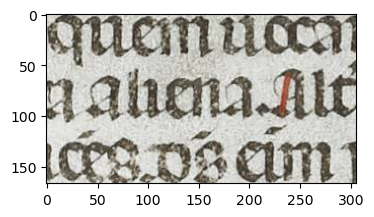

(317, 1683, 193, 102)
10084
Red is not present!


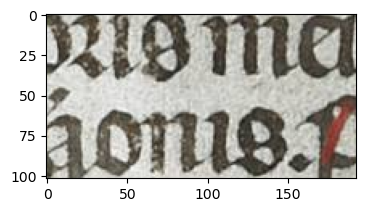

(598, 1735, 275, 539)
44580
Red is present!


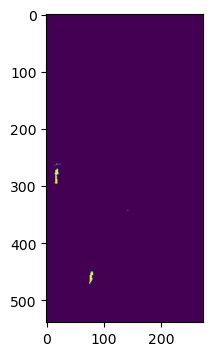

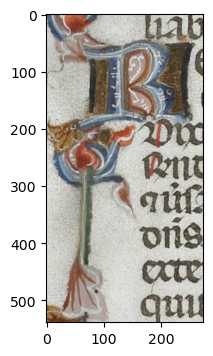

(221, 1744, 275, 125)
8331
Red is not present!


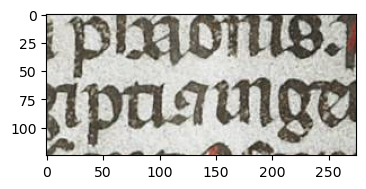

(0, 1746, 210, 148)
12067
Red is not present!


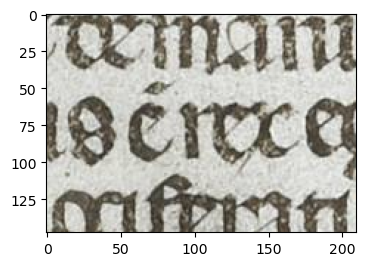

(804, 1746, 279, 74)
5201
Red is not present!


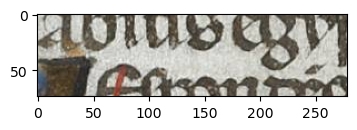

(824, 1749, 275, 275)
51141
Red is not present!


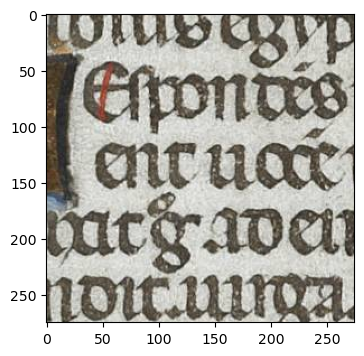

(251, 1798, 256, 108)
15721
Red is not present!


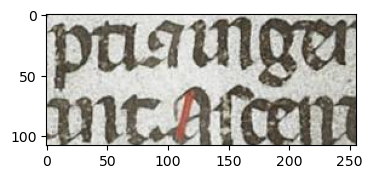

In [159]:
for i in regions[:38]:
    rect = i['rect']
    size = i['size']
    print(rect)
    print(size)
    [X, Y, W, H] = rect
    img_ss_rgb = img[Y:Y+H, X:X+W]

    img_hsv = cv2.cvtColor(snip_BGR[Y:Y+H, X:X+W], cv2.COLOR_BGR2HSV)
    mask1 = cv2.inRange(img_hsv, (0,50,20), (5,255,255))
    mask2 = cv2.inRange(img_hsv, (175,50,20), (180,255,255))
    mask = cv2.bitwise_or(mask1, mask2 )

    # Determine if the color exists on the image
    if cv2.countNonZero(mask) > 0:
        print('Red is present!')
        
        plt.imshow(mask)
        plt.show()
    else:
        print('Red is not present!')
        
    fig = plt.figure(figsize=(4, 4))

    plt.imshow(img_ss_rgb)
    plt.show() #for control

    #fig.savefig('./SS_crops/{}_{}.jpg'.format(folio_nr,str(rect)), dpi=fig.dpi)

In [70]:
save_name = '{}_B.jpg'.format(folio_nr)

In [71]:
# saving crop to scratch dir
image_scrath_path = scratch_dir + 'output/' + save_name
cv2.imwrite(image_scrath_path, cv2.cvtColor(snip_RGB, cv2.COLOR_BGR2RGB))

True

In [54]:
# saving image locally
cv2.imwrite(save_name, cv2.cvtColor(snip_RGB, cv2.COLOR_BGR2RGB))

True

In [ ]:
# upload from scratch to ManGo

In [72]:
# create a new collection
# session.collections.create(suzanna_team_dir + '/image_crops/initials_small') # created
# session.collections.create(suzanna_team_dir + '/image_crops/swirls') # created
# suzanna_coll.subcollections


# from local to ManGO
# session.data_objects.put(save_name, suzanna_team_dir + '/initials_small/' + save_name)
# from scratch to ManGo
session.data_objects.put(scratch_dir + 'output/' + save_name, suzanna_team_dir + '/initials_small/' + save_name)
# session.data_objects.put(scratch_dir + 'output/' + save_name, suzanna_team_dir + '/swirls/' + save_name)
print('saved to', suzanna_team_dir + '/swirls/' + save_name)

saved to /ghum/home/ghum_pilot034/TEAM_2/output_suzanna/swirls/31_B.jpg


Removing background

https://github.com/OPHoperHPO/image-background-remove-tool
https://colab.research.google.com/github/OPHoperHPO/image-background-remove-tool/blob/master/docs/other/carvekit_try.ipynb#scrollTo=7C4rC_HQi1gq

In [164]:
print(torch.cuda.is_available())
print(torch.__version__)

False
1.11.0+cu113


In [161]:
torch.zeros(1).cuda()

RuntimeError: Found no NVIDIA driver on your system. Please check that you have an NVIDIA GPU and installed a driver from http://www.nvidia.com/Download/index.aspx

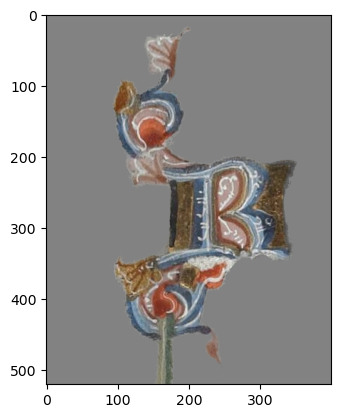

In [73]:
import torch
from carvekit.api.high import HiInterface

# Check doc strings for more information
interface = HiInterface(object_type="object",  # Can be "object" or "hairs-like". # object = tracer_b7
                        batch_size_seg=5,
                        batch_size_matting=1,
                        device='cuda' if torch.cuda.is_available() else 'cpu',
                        seg_mask_size=640,  # Use 640 for Tracer B7 and 320 for U2Net
                        matting_mask_size=2048,
                        trimap_prob_threshold=231,
                        trimap_dilation=30,
                        trimap_erosion_iters=5,
                        fp16=False)
images_without_background = interface([image_scrath_path])
cat_wo_bg = images_without_background[0]

# save image to scratch
image_cropped_path = scratch_dir + 'image_crops/small_initials/' + save_name[:-4] + '.png' # must be png to contain transparency information
cat_wo_bg.save(image_cropped_path)

# reading image in cv2 and cropping it
img = cv2.imread(image_cropped_path)
im_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(im_rgb)
# plt.rcParams["figure.figsize"] = (20,20)
plt.show()

In [74]:
session.data_objects.put(image_cropped_path, suzanna_team_dir + '/image_crops/swirls/' + save_name[:-4] + '.png')
session.data_objects.put(image_cropped_path, suzanna_team_dir + '/image_crops/initials_small/' + save_name[:-4] + '.png')